## import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from mpl_toolkits import mplot3d

In [2]:
data = pd.read_csv('CC GENERAL.csv')

## EDA - Exploratory Data Analysis

In [3]:
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
data.sample(5)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
6032,C16202,481.807171,0.909091,2331.40,842.9,1488.50,0.000000,0.750000,0.416667,0.666667,0.000000,0,24,4500.0,1859.888094,164.943132,0.000000,12
3882,C13992,1184.924492,0.900000,306.00,234.0,72.00,1314.443111,0.400000,0.200000,0.300000,0.200000,8,7,3000.0,500.833154,672.890662,0.000000,10
2341,C12414,3338.863375,1.000000,775.00,365.0,410.00,0.000000,0.583333,0.166667,0.416667,0.000000,0,8,8500.0,920.748289,784.929199,0.000000,12
5781,C15943,51.640761,1.000000,453.24,0.0,453.24,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,5000.0,507.364658,170.772711,0.363636,12
1712,C11768,3013.590493,1.000000,0.00,0.0,0.00,341.360876,0.000000,0.000000,0.000000,0.583333,7,0,3000.0,750.160714,1329.881951,0.000000,12


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [6]:
data.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

## Boslukları ortalama ile dolduralım

In [7]:
def bosluk(column):
    data[column] = data[column].fillna(data[column].mean())

In [8]:
bosluk('CREDIT_LIMIT')
bosluk('MINIMUM_PAYMENTS')

In [9]:
data.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

## plotting

In [10]:
data.corr()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.322412,0.181261,0.164350,0.126469,0.496692,-0.077944,0.073166,-0.063186,0.449218,0.385152,0.154338,0.531267,0.322802,0.394282,-0.318959,0.072692
BALANCE_FREQUENCY,0.322412,1.000000,0.133674,0.104323,0.124292,0.099388,0.229715,0.202415,0.176079,0.191873,0.141555,0.189626,0.095795,0.065008,0.114249,-0.095082,0.119776
PURCHASES,0.181261,0.133674,1.000000,0.916845,0.679896,-0.051474,0.393017,0.498430,0.315567,-0.120143,-0.067175,0.689561,0.356959,0.603264,0.093515,0.180379,0.086288
ONEOFF_PURCHASES,0.164350,0.104323,0.916845,1.000000,0.330622,-0.031326,0.264937,0.524891,0.127729,-0.082628,-0.046212,0.545523,0.319721,0.567292,0.048597,0.132763,0.064150
INSTALLMENTS_PURCHASES,0.126469,0.124292,0.679896,0.330622,1.000000,-0.064244,0.442418,0.214042,0.511351,-0.132318,-0.073999,0.628108,0.256496,0.384084,0.131687,0.182569,0.086143
CASH_ADVANCE,0.496692,0.099388,-0.051474,-0.031326,-0.064244,1.000000,-0.215507,-0.086754,-0.177070,0.628522,0.656498,-0.075850,0.303983,0.453238,0.139223,-0.152935,-0.068312
PURCHASES_FREQUENCY,-0.077944,0.229715,0.393017,0.264937,0.442418,-0.215507,1.000000,0.501343,0.862934,-0.308478,-0.203478,0.568430,0.119778,0.103464,0.002976,0.305802,0.061506
ONEOFF_PURCHASES_FREQUENCY,0.073166,0.202415,0.498430,0.524891,0.214042,-0.086754,0.501343,1.000000,0.142329,-0.111716,-0.069088,0.544869,0.295030,0.243537,-0.029963,0.157531,0.082466
PURCHASES_INSTALLMENTS_FREQUENCY,-0.063186,0.176079,0.315567,0.127729,0.511351,-0.177070,0.862934,0.142329,1.000000,-0.262958,-0.169207,0.529975,0.060752,0.085551,0.029590,0.250087,0.073275
CASH_ADVANCE_FREQUENCY,0.449218,0.191873,-0.120143,-0.082628,-0.132318,0.628522,-0.308478,-0.111716,-0.262958,1.000000,0.799561,-0.131168,0.132616,0.183192,0.097898,-0.249773,-0.133372


In [11]:
fig = px.scatter(data, y = "BALANCE", x = "CREDIT_LIMIT", color="CASH_ADVANCE")
fig.show()

## Clustering

In [12]:
x = data.drop('CUST_ID', axis = 1)

In [13]:
model = KMeans(4)
model.fit(x)
tahmin = model.predict(x)
tahmin

array([0, 1, 1, ..., 0, 0, 0])

In [14]:
silhouette_score(x, tahmin)

0.464450664591727

In [15]:
x['Cluster'] = tahmin
x.sample(10)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
359,1543.287931,1.000000,0.00,0.00,0.00,36.481832,0.00,0.000000,0.000000,0.083333,1,0,1800.0,548.589391,529.340488,0.000000,12,0
2750,1141.349418,1.000000,6003.86,3474.35,2529.51,0.000000,1.00,0.916667,1.000000,0.000000,0,110,2500.0,6848.237541,287.308650,0.083333,12,0
2936,689.764098,0.818182,0.00,0.00,0.00,2289.788850,0.00,0.000000,0.000000,0.416667,8,0,1800.0,2476.929255,202.931859,0.000000,12,0
8068,7.554365,1.000000,88.56,0.00,88.56,0.000000,1.00,0.000000,0.916667,0.000000,0,12,1500.0,68.855232,73.081017,0.285714,12,0
2278,2719.526277,1.000000,448.07,448.07,0.00,3474.764847,0.25,0.250000,0.000000,0.333333,4,7,3000.0,3537.693441,1105.400886,0.083333,12,0
4277,10.386311,0.818182,171.60,0.00,171.60,0.000000,1.00,0.000000,1.000000,0.000000,0,12,4000.0,168.370514,82.263245,0.454545,12,0
7566,1186.276559,1.000000,391.67,391.67,0.00,0.000000,0.50,0.500000,0.000000,0.000000,0,8,1200.0,488.194864,927.681751,0.000000,12,0
5376,21.187313,0.272727,319.41,0.00,319.41,0.000000,0.25,0.000000,0.166667,0.000000,0,6,6000.0,135.546054,29.013477,0.083333,12,0
3113,1950.956894,0.833333,0.00,0.00,0.00,2844.307484,0.00,0.000000,0.000000,0.166667,2,0,3000.0,300.713950,405.461471,0.000000,6,0
5908,2963.381127,1.000000,535.97,535.97,0.00,38.953008,0.75,0.750000,0.000000,0.083333,1,10,5000.0,638.384571,1027.923953,0.000000,12,0


In [16]:
x.corr()['Cluster'].sort_values(ascending = False)

Cluster                             1.000000
CREDIT_LIMIT                        0.748664
BALANCE                             0.543003
PAYMENTS                            0.519328
PURCHASES                           0.393172
MINIMUM_PAYMENTS                    0.391636
CASH_ADVANCE                        0.383409
ONEOFF_PURCHASES                    0.352733
PURCHASES_TRX                       0.315589
INSTALLMENTS_PURCHASES              0.281482
ONEOFF_PURCHASES_FREQUENCY          0.262837
CASH_ADVANCE_TRX                    0.227454
CASH_ADVANCE_FREQUENCY              0.205673
BALANCE_FREQUENCY                   0.153139
TENURE                              0.104734
PURCHASES_FREQUENCY                 0.101746
PURCHASES_INSTALLMENTS_FREQUENCY    0.064593
PRC_FULL_PAYMENT                   -0.002616
Name: Cluster, dtype: float64

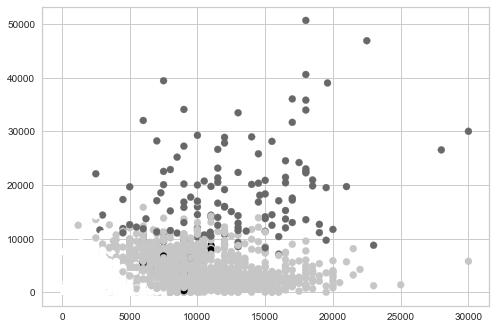

In [17]:
plt.scatter(x.CREDIT_LIMIT, x.PAYMENTS, c = tahmin);
plt.show()

In [18]:
fig = px.scatter(data_frame = x, x = "PAYMENTS", y = "CREDIT_LIMIT", color="Cluster")
fig.show()

In [19]:
fig = px.scatter(data_frame = x, x = "BALANCE", y = "CREDIT_LIMIT", color="Cluster")
fig.show()

In [20]:
allscore = []
allcluster = []
distances = []
def clust(kactane):
    for i in range(1, kactane):
        i = i + 1
        model = KMeans(i)
        model = model.fit(x)
        tahmin = model.predict(x)
        score = silhouette_score(x, tahmin)
        distance = model.inertia_  # orta noktalar
        print('Cluster ', i, "Score : ", score)
        allscore.append(score)
        allcluster.append(i)
        distances.append(distance)
clust(10)

Cluster  2 Score :  0.5116392706833048
Cluster  3 Score :  0.4669271643612482
Cluster  4 Score :  0.46474254212223604
Cluster  5 Score :  0.4075004214472231
Cluster  6 Score :  0.3688018731163703
Cluster  7 Score :  0.36999738446749586
Cluster  8 Score :  0.38169645936592034
Cluster  9 Score :  0.352407804629176
Cluster  10 Score :  0.3528383224847632


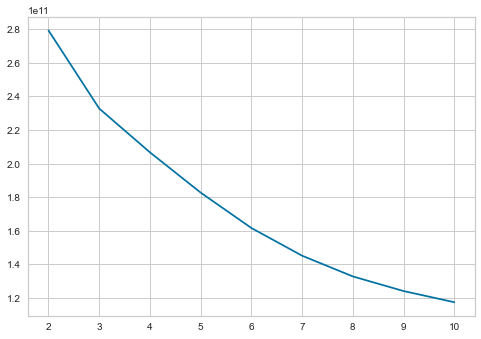

In [21]:
plt.plot(allcluster, distances);
# Elbow dirsek metodu

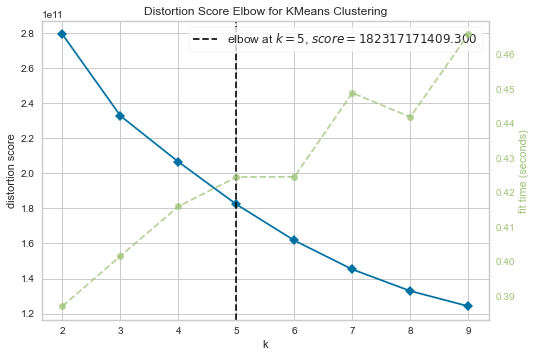

In [22]:
km = KMeans(random_state=42)      # KMeans modelini oluştur ve dirsek yöntemini kullanarak optimal küme sayısını belirler.
visualizer = KElbowVisualizer(km, k=(2,10))    # Küme sayısını 2 ile 10 arasında değiştirerek deneyebilirsiniz

visualizer.fit(x) # Fit the data to the visualizer
visualizer.show(); # Finalize and render the figure

## Hierarchical Clustering

In [23]:
x = x[['CREDIT_LIMIT', 'PAYMENTS', 'BALANCE']]


In [24]:
model = KMeans(5)
model.fit(x)
tahmin = model.predict(x)
tahmin

array([2, 0, 0, ..., 2, 2, 2])

In [25]:
pd.DataFrame(tahmin).value_counts()

2    5317
0    2325
1     686
3     538
4      84
dtype: int64

In [26]:
x['cluster'] = tahmin

In [27]:
fig = px.scatter(data_frame = x, x = "BALANCE", y = "CREDIT_LIMIT", color="cluster")
fig.show()

## 3 boyutlu görüntüleme

In [28]:
fig = px.scatter_3d(x, x='CREDIT_LIMIT', y='BALANCE', z='PAYMENTS',
              color='cluster')
fig.show()

## Scale

In [29]:
x = x.drop('cluster', axis = 1)

In [30]:
x = StandardScaler().fit_transform(x)
model = KMeans(5)
model.fit(x)
tahmin = model.predict(x)
tahmin

array([2, 0, 0, ..., 2, 2, 2])

In [31]:
pd.DataFrame(tahmin).value_counts()

2    5725
0    1778
1     898
4     486
3      63
dtype: int64

In [35]:
x = pd.DataFrame(x)
x['cluster'] = tahmin

,0,1,2,cluster
0,-0.960433,-0.528979,-0.731989,2
1,0.688639,0.818642,0.786961,0
2,0.826062,-0.383805,0.447135,0
3,0.826062,-0.598688,0.049099,0
4,-0.905464,-0.364368,-0.358775,2
...,...,...,...,...
8945,-0.960433,-0.486217,-0.737950,2
8946,-0.960433,-0.503396,-0.742423,2
8947,-0.960433,-0.570615,-0.740398,2
8948,-1.097856,-0.580536,-0.745174,2


In [37]:
x.columns = ['BALANCE', 'CREDIT_LIMIT', 'PAYMENTS', 'Cluster']
x

,BALANCE,CREDIT_LIMIT,PAYMENTS,Cluster
0,-0.960433,-0.528979,-0.731989,2
1,0.688639,0.818642,0.786961,0
2,0.826062,-0.383805,0.447135,0
3,0.826062,-0.598688,0.049099,0
4,-0.905464,-0.364368,-0.358775,2
...,...,...,...,...
8945,-0.960433,-0.486217,-0.737950,2
8946,-0.960433,-0.503396,-0.742423,2
8947,-0.960433,-0.570615,-0.740398,2
8948,-1.097856,-0.580536,-0.745174,2


In [39]:
fig = px.scatter(data_frame = x, x = "BALANCE", y = "CREDIT_LIMIT", color="Cluster")
fig.show()

In [40]:
fig = px.scatter_3d(x, x = 'CREDIT_LIMIT', y = 'BALANCE', z = 'PAYMENTS',
              color='Cluster')
fig.show()